# MediaPipe FaceMesh TFLite for Mascarons 3D Recontruction 

**AUTHOR: CAMELIA CIOLAC**  
ciolac_c@inria-alumni.fr


In this mini-projet, we use Google's MediaPipe framework as well as a pretrained Tensorflow Lite model to predict the face mesh given an image of a mascaron (sculptured keystone). We visualize the reconstructed face in 3D, with skin texture.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Circle
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d
%matplotlib inline

In [ ]:
!mkdir -p "/content/gdrive/My Drive/sculptures"

In [ ]:
!pip install mediapipe 

     |████████████████████████████████| 34.5MB 131kB/s 
     |████████████████████████████████| 49.1MB 89kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30


In [ ]:
%%%capture
#install on colab taken from https://github.com/pyvista/pyvista/issues/313
!pip install -q piglet pyvirtualdisplay
!pip install -q pyvista
!apt-get -qq install xvfb

In [ ]:
#needed by pyvista
from pyvirtualdisplay import Display
display = Display(visible=0, size=(600, 400))
display.start()

In [ ]:
import pandas as pd
import numpy as np
import math
import scipy.interpolate

from PIL import Image as pilim
import collections

import pprint

import pyvista as pv

import mediapipe as mp

import cv2
cv2.__version__

'3.4.11'

In [ ]:
import os
#logging levels : 0 = INFO , 1 = WARN , 2 = ERROR, 3 = none (not used in TF2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

import tensorflow as tf
from tensorflow.python.lib.io import file_io
import tensorflow_hub as hub
print("TF version:", tf.__version__)

#logging level for TF2
tf.get_logger().setLevel('ERROR')

#devices discovered by TF2
physical_devices = tf.config.list_physical_devices()
for pdev in physical_devices:
  print(pdev)

TF version: 2.3.0
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU')


## Download some images of sculptures

Mascarons in French cities: 

In [ ]:
%%bash

cd "/content/gdrive/My Drive/sculptures"

wget -q "https://img.over-blog-kiwi.com/1/33/13/50/20151120/ob_71d4e3_20140616-133849.jpg" -O mascaron1.jpg
wget -q  "https://i.pinimg.com/originals/91/7c/fd/917cfd6c1eaa2d45107cbf66ac56c8ca.jpg"  -O mascaron2.jpg
wget -q "http://www.mascaron.fr/wp-content/uploads/2014/05/IMG_7581-Version-2.jpg" -O mascaron3.jpg
wget -q  "https://live.staticflickr.com/3616/3385488990_afe02ce0c2_b.jpg"  -O mascaron4.jpg
wget -q "https://www.marseille-mascarons.fr/uploads/2/5/9/8/25981703/103mdm305-copie-2-copie_orig.jpg" -O mascaron5.jpg
wget -q  "https://i.pinimg.com/originals/52/62/97/526297d2d09bad165b335e146ee6d0d4.jpg"  -O mascaron6.jpg
wget -q  "https://i.pinimg.com/originals/de/fd/53/defd53b20b4cb9f1a7f7c184e8d0ca4c.jpg"  -O mascaron7.jpg
wget -q  "https://discover-paris-with-georges.e-monsite.com/medias/album/p1110668.jpg"  -O mascaron8.jpg
wget -q "https://st2.depositphotos.com/1765681/6276/i/450/depositphotos_62769831-stock-photo-funny-mascaron-on-the-art.jpg" -O mascaron9.jpg
wget -q "https://i.pinimg.com/originals/0e/27/d6/0e27d6d39601c4d92ac5a72ea973c1e4.jpg" -O mascaron10.jpg

In [ ]:
FOLDER_IMAGES = "/content/gdrive/My Drive/sculptures/"

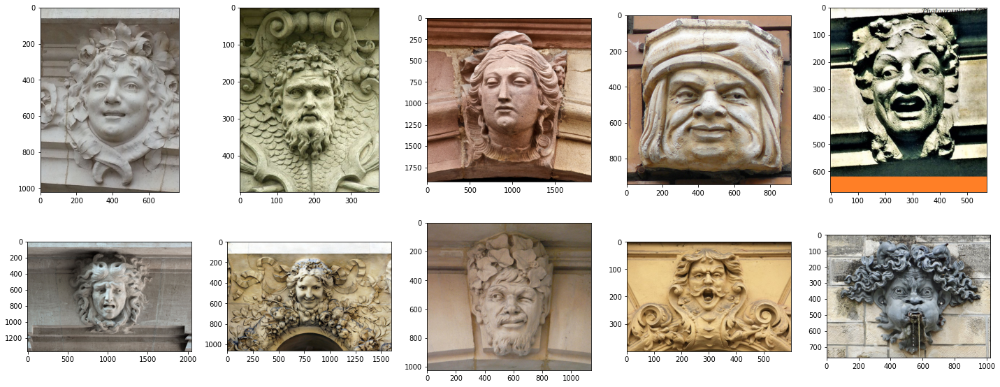

In [ ]:
fig = plt.figure(figsize = (20,8))

for ii in range(1,11):
    im1_aux = pilim.open(FOLDER_IMAGES + "mascaron{}.jpg".format(ii))
    ax = fig.add_subplot(2,5,ii)
    ax.imshow(im1_aux)
fig.tight_layout()

## Download pretrained TFLite model from Mediapipe

See
- https://google.github.io/mediapipe/solutions/face_mesh.html

Reference:

[1] Real-time Facial Surface Geometry from Monocular Video on Mobile GPUs, CVPR Workshop on Computer Vision for Augmented and Virtual Reality, Long Beach, CA, USA, 2019


In [ ]:
#inspect remote resource without download
!wget --spider "https://github.com/google/mediapipe/raw/master/mediapipe/models/face_landmark.tflite"

Spider mode enabled. Check if remote file exists.
--2020-11-24 21:04:36--  https://github.com/google/mediapipe/raw/master/mediapipe/models/face_landmark.tflite
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/google/mediapipe/master/mediapipe/models/face_landmark.tflite [following]
Spider mode enabled. Check if remote file exists.
--2020-11-24 21:04:36--  https://raw.githubusercontent.com/google/mediapipe/master/mediapipe/models/face_landmark.tflite
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2439440 (2.3M) [application/octet-stream]
Remote file exists.



In [ ]:
!mkdir -p /tmp/tfhub_models/
!cd /tmp/tfhub_models/ &&  wget -q "https://github.com/google/mediapipe/raw/master/mediapipe/models/face_landmark.tflite" 
!cd /tmp/tfhub_models/ && du -h face_landmark.tflite 

2.4M	face_landmark.tflite


## Read image

In [ ]:
def get_image(file_path):
    """ read image from specified location, which can be the 
        local filesystem path or a GCP Storage blob URI"""
    with file_io.FileIO(file_path, 'rb') as f:
        im = tf.io.decode_image(f.read())
        #since we're in eager execution mode in TF, we can easily convert tensor to numpy
        im_arr = im.numpy()
    return im, im_arr

In [ ]:
im1_tens, im1_arr = get_image(file_path = FOLDER_IMAGES + "mascaron1.jpg")
print("im_tens:".ljust(20), im1_tens.shape, im1_tens.dtype, type(im1_tens))
print("im_arr:".ljust(20), im1_arr.shape, im1_arr.dtype, type(im1_arr))


im_tens:             (1024, 768, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>
im_arr:              (1024, 768, 3) uint8 <class 'numpy.ndarray'>


### Crop image's central square 





In [ ]:
def crop_central_square(im1_tens, preset_delta_ = None):
    """take a central square of the image with edge either 2* preset_delta_ (if not none)
       or min among image's height and width"""

    h_initial = im1_tens.shape[0]
    w_initial = im1_tens.shape[1]
    central_y = int(h_initial/2)
    central_x = int(w_initial/2)

    if preset_delta_ is None:
        #take min between height and width
        min_h_w = min(h_initial, w_initial)
        delta_ = int(min_h_w/2)
    else:
        delta_ = preset_delta_

    im1_tens_centralcrop = im1_tens[central_y - delta_: central_y + delta_,
                                    central_x - delta_: central_x + delta_]

    return im1_tens_centralcrop

In [ ]:
im1_tens_centralcrop = crop_central_square(im1_tens, preset_delta_ = 300)
print("im1_tens_centralcrop:".ljust(20), im1_tens_centralcrop.shape, im1_tens_centralcrop.dtype, type(im1_tens_centralcrop))

im1_tens_centralcrop: (600, 600, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>


In [ ]:
#we're in tf eager execuion mode
im1_arr_centralcrop = im1_tens_centralcrop.numpy()
print("im1_arr_centralcrop:".ljust(20), im1_arr_centralcrop.shape, im1_arr_centralcrop.dtype, type(im1_arr_centralcrop))

im1_arr_centralcrop: (600, 600, 3) uint8 <class 'numpy.ndarray'>


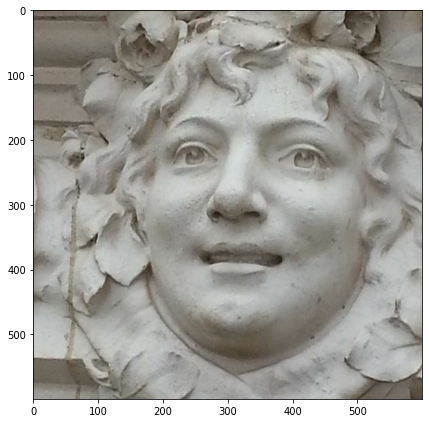

In [ ]:
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_centralcrop)
fig.tight_layout()

## Inference with Google's MediaPipe Framework

To get a result out-of-the-box, we can rely on this Python package to perform the end-to-end face mesh detection and visualization, on image of any size

In [ ]:
mp_face_mesh = mp.solutions.face_mesh.FaceMesh(
                static_image_mode=True,
                max_num_faces=1,
                min_detection_confidence=0.1)

results = mp_face_mesh.process(im1_arr_centralcrop)
results

mediapipe.python.solution_base.SolutionOutputs

In [ ]:
list_face_landmarks = results.multi_face_landmarks
print(type(list_face_landmarks), type(list_face_landmarks[0]))
#this is how we get the coords of a landmark
landmark_id = 467
list_face_landmarks[0].landmark[landmark_id]

<class 'list'> <class 'mediapipe.framework.formats.landmark_pb2.NormalizedLandmarkList'>


x: 0.7507494688034058
y: 0.3680945336818695
z: 0.024366630241274834
visibility: 0.0
presence: 0.0

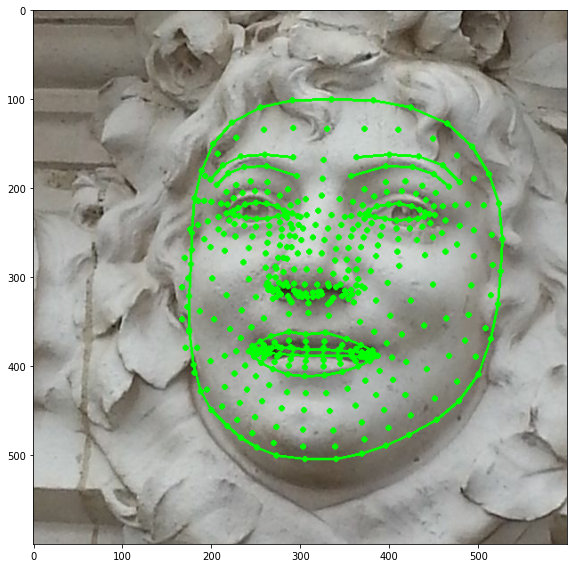

In [ ]:
drawing_spec = mp.solutions.drawing_utils.DrawingSpec(thickness=2, circle_radius=2, color=(0,255,0))

im1_arr_centralcrop_cpy = im1_arr_centralcrop.copy()

for face_landmarks in results.multi_face_landmarks:
    mp.solutions.drawing_utils.draw_landmarks(
        image = im1_arr_centralcrop_cpy,
        landmark_list = face_landmarks,
        connections = mp.solutions.face_mesh.FACE_CONNECTIONS,
        landmark_drawing_spec = drawing_spec,
        connection_drawing_spec = drawing_spec)
    

fig,ax = plt.subplots(1,1, figsize = (8,8))
ax.imshow(im1_arr_centralcrop_cpy)
fig.tight_layout()

### Visualize 3D reconstruction for the results from MediaPipe 

In [ ]:
def extract_xyz_coords(list_face_landmarks):
    """ given a list of lanfmarks returned by the mediapipe inference, 
        extract the xyz coordinates and return a dictionary of these"""
    
    num_landmarks = 468
    xs = np.zeros(num_landmarks)
    ys = np.zeros(num_landmarks)
    zs = np.zeros(num_landmarks)

    im_w = im1_arr_centralcrop.shape[0]
    im_h = im1_arr_centralcrop.shape[1]

    for ii in range(num_landmarks):
        landmark = list_face_landmarks[0].landmark[ii]
        xs[ii] = landmark.x * im_w
        ys[ii] = landmark.y * im_h
        zs[ii] = landmark.z 

    dict_coords = {"xs":xs, "ys":ys, "zs":zs}
    return dict_coords

In [ ]:
dict_coords = extract_xyz_coords(list_face_landmarks)
xs = dict_coords["xs"]
ys = dict_coords["ys"]
zs = dict_coords["zs"]

Note: we can extract the upper lip and lower lip, as well as the eyes landmarks. The reference numbering is provided at:


In [ ]:
!cd /tmp && wget -q "https://github.com/tensorflow/tfjs-models/raw/master/facemesh/mesh_map.jpg"

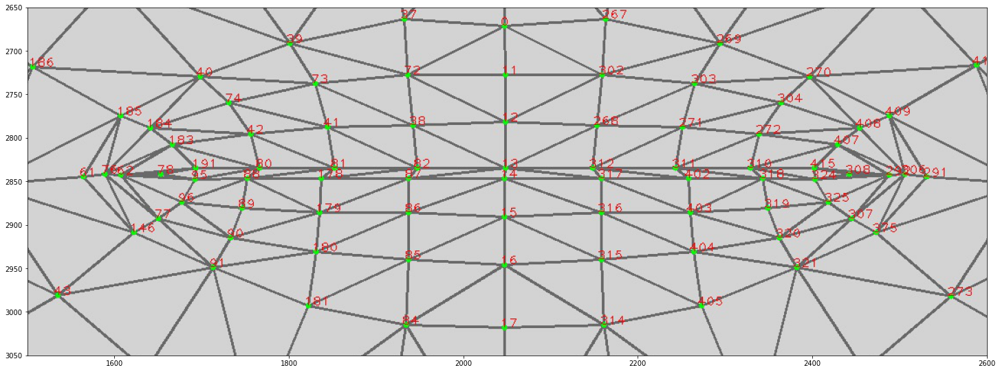

In [ ]:
#here we focus on the lips of the reference numbering
fig,ax = plt.subplots(1,1, figsize = (25,10))
im_aux = pilim.open("/tmp/mesh_map.jpg")
ax.imshow(im_aux)
ax.set_xlim(1500,2600)
ax.set_ylim(2650,3050)
ax.invert_yaxis();

In [ ]:
upper_lip_points = [61, 185, 40, 39, 37, 0, 267, 269, 270, 409, 291,
                    306, 308, 415, 310, 311, 312, 13, 82, 81, 80, 191, 78,62,76]
lower_lip_points = [61, 146, 91, 181, 84, 17, 314, 405, 321, 375, 291,
                    306, 324, 318, 402, 317, 14, 87, 178, 88, 95, 62]

left_eye = [362, 398, 384, 385, 386, 387, 388, 466, 263, 249, 390, 373, 374, 380, 381, 382, 362]
right_eye = [133, 173, 157, 158, 159, 160, 161, 246, 33, 7, 163, 144, 145, 153, 154, 155, 133]
nose_central_line = [6, 197, 195, 5, 4, 1, 19, 94]
nose = [413, 465, 412, 399, 456, 363, 440, 457, 461, 354, 19, 125, 241, 237, 220, 134, 236, 174, 188, 245, 189]

upper_lip_points_xs = xs[upper_lip_points]
upper_lip_points_ys = ys[upper_lip_points]
upper_lip_points_zs = zs[upper_lip_points]

lower_lip_points_xs = xs[lower_lip_points]
lower_lip_points_ys = ys[lower_lip_points]
lower_lip_points_zs = zs[lower_lip_points]

left_eye_points_xs = xs[left_eye]
left_eye_points_ys = ys[left_eye]
left_eye_points_zs = zs[left_eye]

right_eye_points_xs = xs[right_eye]
right_eye_points_ys = ys[right_eye]
right_eye_points_zs = zs[right_eye]

nose_points_xs = xs[nose_central_line]
nose_points_ys = ys[nose_central_line]
nose_points_zs = zs[nose_central_line]

upper_lip_points_xs

array([242.1000123 , 246.07965946, 255.10393381, 267.23041534,
       287.21430302, 306.93154335, 328.76783609, 352.33676434,
       368.28067303, 381.07341528, 387.3239994 , 383.74371529,
       379.185462  , 369.50426102, 356.99501038, 342.44123697,
       326.00548267, 308.32893848, 292.64711738, 279.45678234,
       268.63489151, 259.70631838, 252.07201838, 249.59235191,
       245.68963051])

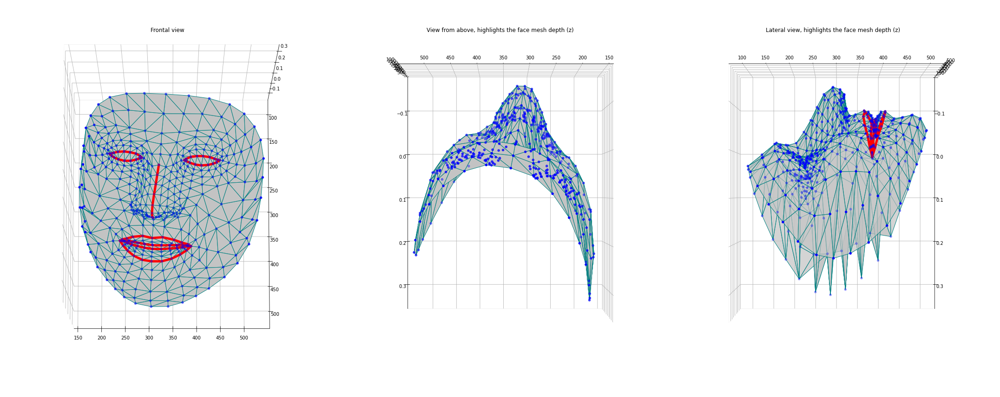

In [ ]:
fig = plt.figure(figsize=(30,12))
ax_3d = fig.add_subplot(131, projection='3d')
ax_3d.plot_trisurf(xs, ys, zs, color='white', edgecolors='teal', alpha=1.0, zorder=1)
ax_3d.scatter(xs, ys, zs, c='blue', zorder=2)
ax_3d.plot(upper_lip_points_xs, upper_lip_points_ys, upper_lip_points_zs, c='red', linewidth=5, zorder=3 )
ax_3d.plot(lower_lip_points_xs, lower_lip_points_ys, lower_lip_points_zs, c='red', linewidth=5, zorder=3 )
ax_3d.plot(left_eye_points_xs, left_eye_points_ys, left_eye_points_zs, c='red', linewidth=5, zorder=3 )
ax_3d.plot(right_eye_points_xs, right_eye_points_ys, right_eye_points_zs, c='red', linewidth=5, zorder=3 )
ax_3d.plot(nose_points_xs, nose_points_ys, nose_points_zs, c='red', linewidth=5, zorder=3 )
#position camera 
ax_3d.view_init(elev=80, azim=90)
ax_3d.dist = 9
ax_3d.invert_xaxis()
#make white the planes of the axes
ax_3d.xaxis.pane.fill = False
ax_3d.yaxis.pane.fill = False
ax_3d.zaxis.pane.fill = False
ax_3d.set_title("Frontal view")

ax2_3d = fig.add_subplot(132, projection='3d')
ax2_3d.plot_trisurf(xs, ys, zs, color='white', edgecolors='teal', alpha=1.0)
ax2_3d.scatter(xs, ys, zs, c='blue')
#position camera 
ax2_3d.view_init(elev=180, azim=90)
ax2_3d.dist = 9
#make white the planes of the axes
ax2_3d.xaxis.pane.fill = False
ax2_3d.yaxis.pane.fill = False
ax2_3d.zaxis.pane.fill = False
ax2_3d.set_title("View from above, highlights the face mesh depth (z)")

ax3_3d = fig.add_subplot(133, projection='3d')
#here we swap xs and ys
ax3_3d.plot_trisurf(ys, xs, zs, color='white', edgecolors='teal', alpha=0.7,zorder=1)
ax3_3d.scatter(ys, xs, zs, c='blue', zorder=2)
ax3_3d.plot(upper_lip_points_ys, upper_lip_points_xs, upper_lip_points_zs, c='red', linewidth=5, zorder=3 )
ax3_3d.plot(lower_lip_points_ys, lower_lip_points_xs, lower_lip_points_zs, c='red', linewidth=5, zorder=3 )
#position camera 
ax3_3d.view_init(elev=180, azim=-90)
ax3_3d.dist = 9
#make white the planes of the axes
ax3_3d.xaxis.pane.fill = False
ax3_3d.yaxis.pane.fill = False
ax3_3d.zaxis.pane.fill = False
ax3_3d.set_title("Lateral view, highlights the face mesh depth (z)")

fig.tight_layout()

### Visualize face mesh 3D with texture

Since matplotlib doesn't support textures, an alternative is pyvista

In [ ]:
!cd /tmp && wget -q "https://image.freepik.com/free-photo/close-up-dry-cheek-skin-texture-face-skin-care-concept_31825-643.jpg" -O "skin_texture.jpg"

In [ ]:
pv.set_plot_theme("document")

In [ ]:
points = [[xs[ii], ys[ii], zs[ii] * im1_arr_centralcrop.shape[0]] for ii in range(len(xs))]
point_cloud = pv.PolyData(points)

point_cloud["elevation"] = zs

point_cloud

PolyData (0x7f880d5cfe88)
  N Cells:	468
  N Points:	468
  X Bounds:	1.676e+02, 5.276e+02
  Y Bounds:	1.001e+02, 5.047e+02
  Z Bounds:	-8.592e+01, 1.931e+02
  N Arrays:	1

In [ ]:
#Create Triangulated Surface
surf = point_cloud.delaunay_2d()
print(type(surf))

surf

surf.textures

<class 'pyvista.core.pointset.PolyData'>


{}

In [ ]:
#if we don't pass cpos, it will return cpos after the plot. then we can refine that one
cpos = [(951.64191070311, 906.4951563190692, 604.1451662119501),
        (347.5860267877579, 302.43927240371704, 0.08928229659795761),
        (0.0, 0.0, 1.0)]

#cpos is set in terms of rotation, translation
cpos_custom = [(300, 806, 800),  
               (347, 302, 0),
               (0.0, 0.0, 1.0)]

plotter = pv.Plotter(notebook=True)
plotter.add_mesh(surf, cmap="coolwarm_r", opacity = 1.0, show_edges=True, interpolate_before_map=True)
plotter.show(cpos = cpos_custom, screenshot= FOLDER_IMAGES + '3dheatmap_z.png')

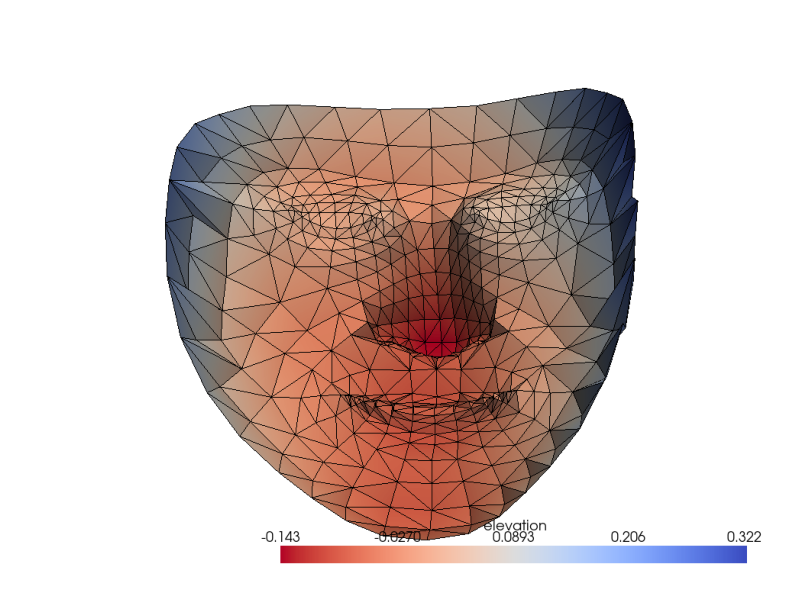

In [ ]:
im_aux = pilim.open(FOLDER_IMAGES + "3dheatmap_z.png")
fig,ax=plt.subplots(1,1,figsize=(14,14))
ax.imshow(im_aux);
ax.axis("off");

Load and add texture:

In [ ]:
#load a jpg as a texture
tex = pv.read_texture("/tmp/skin_texture.jpg")
print(type(tex))

#we can also load a numpy array as texture
face_bbox = [int(xs.min()), int(xs.max()), int(ys.min()), int(ys.max())]
print(face_bbox)
im1_arr_bbox_face = im1_arr_centralcrop[face_bbox[0]:face_bbox[1], face_bbox[2]:face_bbox[3]]
im1_arr_bbox_face_ = np.flip(im1_arr_bbox_face,0)

tex2 = pv.numpy_to_texture(im1_arr_bbox_face_)
tex2

<class 'pyvista.core.objects.Texture'>
[167, 527, 100, 504]


(Texture)0x7f880249d648

In [ ]:
#help(surf.texture_map_to_plane)

In [ ]:
#prepare surface for texture

o = xs.min(), ys.min(), 0.0 
u = xs.max(), ys.min(), 0.0 
v = xs.min(), ys.max(), 0.0 

mapped_surf = surf.texture_map_to_plane(o, u, v)

mapped_surf.textures["aerial"] = tex
mapped_surf.textures

{'aerial': (Texture)0x7f880249d528}

In [ ]:
#cpos is set in terms of rotation, translation, scale
cpos_custom = [(300, 806, 800),  
               (347, 302, 0),
               (0.0, 0.0, 1.0)]

mapped_surf.plot(cpos = cpos_custom, notebook = True, show_edges=False, texture="aerial", 
                 screenshot = FOLDER_IMAGES + '3d_skin_texture.png')

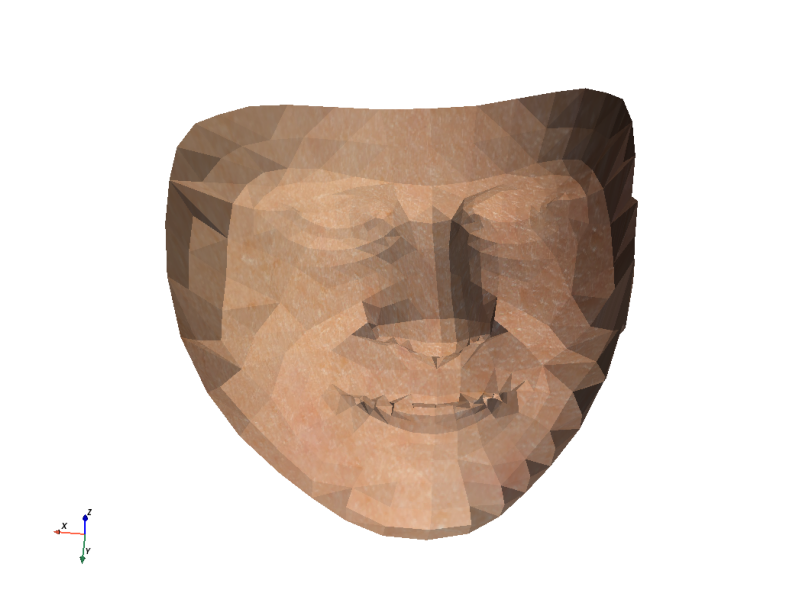

In [ ]:
im_aux = pilim.open(FOLDER_IMAGES + "3d_skin_texture.png")
fig,ax=plt.subplots(1,1,figsize=(14,14))
ax.imshow(im_aux);
ax.axis("off");

Looks interesting. Now, we want to achieve the same, but using the TFLite model directly:

## Inference with the pretrained TFLite model

### Load the TFLite model

In [ ]:
facelandmarks_model = tf.lite.Interpreter(model_path = "/tmp/tfhub_models/face_landmark.tflite")

###Inspect the model's inputs and outputs:

On the model card we can read input requirements at https://mediapipe.page.link/facemesh-mc:

> ​"Image of cropped face with 25% margin on each side and size 192x192 px  
   Should be captured in "selfie" mode.  
   Face cropped from the captured frame should contain a single face placed in the center of the image.  
   There should be a margin around the face calculated as 25% of face size.  
   Image must be rotated in a way that a horizontal line can connect the two centers of the eyes."
   
> It's not suitable when:
 - "looking away from the camera (more than 80°),
 - inclined from the vertical orientation (more than 8°),
 - only partially visible (less than 50% of the face),"

In [ ]:
input_details_fl = facelandmarks_model.get_input_details()
pprint.pprint(input_details_fl)

[{'dtype': <class 'numpy.float32'>,
  'index': 0,
  'name': 'input_1',
  'quantization': (0.0, 0),
  'quantization_parameters': {'quantized_dimension': 0,
                              'scales': array([], dtype=float32),
                              'zero_points': array([], dtype=int32)},
  'shape': array([  1, 192, 192,   3], dtype=int32),
  'shape_signature': array([  1, 192, 192,   3], dtype=int32),
  'sparsity_parameters': {}}]


In [ ]:
output_details_fl = facelandmarks_model.get_output_details()
pprint.pprint(output_details_fl)

[{'dtype': <class 'numpy.float32'>,
  'index': 213,
  'name': 'conv2d_20',
  'quantization': (0.0, 0),
  'quantization_parameters': {'quantized_dimension': 0,
                              'scales': array([], dtype=float32),
                              'zero_points': array([], dtype=int32)},
  'shape': array([   1,    1,    1, 1404], dtype=int32),
  'shape_signature': array([   1,    1,    1, 1404], dtype=int32),
  'sparsity_parameters': {}},
 {'dtype': <class 'numpy.float32'>,
  'index': 210,
  'name': 'conv2d_30',
  'quantization': (0.0, 0),
  'quantization_parameters': {'quantized_dimension': 0,
                              'scales': array([], dtype=float32),
                              'zero_points': array([], dtype=int32)},
  'shape': array([1, 1, 1, 1], dtype=int32),
  'shape_signature': array([1, 1, 1, 1], dtype=int32),
  'sparsity_parameters': {}}]


We can read the semantics of the output in the model's card at https://mediapipe.page.link/facemesh-mc:

> ​"Facial surface represented as 468 3D landmarks
flattened into a 1D tensor: (x1, y1, z1), (x2, y2, z2),
... x- and y-coordinates follow the image pixel
coordinates; z-coordinates are relative to the
face center of mass and are scaled
proportionally to the face width."

### Rescale image to expected input size:

In [ ]:
def rescale_with_tf(im1_tens, target_size = (192, 192)):
    """convert the inut TF tensor to the specified target size"""
    
    t_int32 = tf.cast(im1_tens, tf.int32)

    t_resized = tf.image.resize(t_int32, 
                                size = target_size,
                                method=tf.image.ResizeMethod.BILINEAR, 
                                preserve_aspect_ratio=True,
                                antialias=True, name="resizing")    

    t_resized_casted = tf.cast(t_resized, tf.uint8)
    return t_resized_casted


We need to resize the image to the model's input required size (192, 192, 3) and then make a batch with it in order to arrive to shape (1,192, 192, 3)

In [ ]:
im1_tens_rescaled = rescale_with_tf(im1_tens_centralcrop, target_size = (192,192))
print("im1_tens_rescaled:".ljust(20), im1_tens_rescaled.shape, 
      im1_tens_rescaled.dtype, type(im1_tens_rescaled))

im1_tens_rescaled:   (192, 192, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>


Note: we need to pass a numpy array a input to the TFLite model, not a TF tensor

In [ ]:
#we're in tf eager execuion mode
im1_arr_rescaled = im1_tens_rescaled.numpy()

print("im1_arr_rescaled:".ljust(20), im1_arr_rescaled.shape, im1_arr_rescaled.dtype, type(im1_arr_rescaled))

im1_arr_rescaled:    (192, 192, 3) uint8 <class 'numpy.ndarray'>


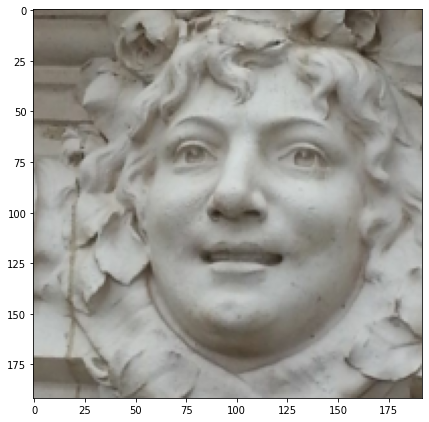

In [ ]:
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)
fig.tight_layout()

### Normalize values in each RGB channel

In [ ]:
def normalize_pixel_values(im1_arr_rescaled):
    """normalize values in each channel of a numpy array representing an RGB image"""

    im1_arr_normalized = np.array(im1_arr_rescaled.copy(), dtype = np.float32)
    im1_arr_normalized[:,:,0] = (im1_arr_normalized[:,:,0] - im1_arr_normalized[:,:,0].mean())/im1_arr_normalized[:,:,0].std()
    im1_arr_normalized[:,:,1] = (im1_arr_normalized[:,:,1] - im1_arr_normalized[:,:,1].mean())/im1_arr_normalized[:,:,1].std()
    im1_arr_normalized[:,:,2] = (im1_arr_normalized[:,:,2] - im1_arr_normalized[:,:,2].mean())/im1_arr_normalized[:,:,2].std()

    return im1_arr_normalized

In [ ]:
im1_arr_normalized = normalize_pixel_values(im1_arr_rescaled)

print("values range after normalization:", im1_arr_normalized.min(), im1_arr_normalized.max())
print("average and stddev after normalization on red channel:", im1_arr_normalized[:,:,0].mean(), im1_arr_normalized[:,:,0].std())
print("average and stddev after normalization on green channel:", im1_arr_normalized[:,:,1].mean(), im1_arr_normalized[:,:,1].std())
print("average and stddev after normalization on blue channel:", im1_arr_normalized[:,:,2].mean(), im1_arr_normalized[:,:,2].std())


values range after normalization: -3.7061582 2.1706824
average and stddev after normalization on red channel: 1.7550256e-07 1.0
average and stddev after normalization on green channel: -1.09275184e-07 1.0000001
average and stddev after normalization on blue channel: -4.635917e-08 1.0


Prepare batch:

In [ ]:
#the input must be batch
batch_arr_preprocessed = np.array([im1_arr_normalized], dtype=np.float32)
print("batch_arr_preprocessed:".ljust(20), batch_arr_preprocessed.shape, batch_arr_preprocessed.dtype)

batch_arr_preprocessed: (1, 192, 192, 3) float32


### Make prediction with TFLite model

In [ ]:
facelandmarks_model.allocate_tensors()

facelandmarks_model.set_tensor(input_details_fl[0]['index'], batch_arr_preprocessed)

In [ ]:
%%time

facelandmarks_model.invoke()

CPU times: user 18 ms, sys: 922 µs, total: 18.9 ms
Wall time: 21.4 ms


In [ ]:
result_face_landmarks = facelandmarks_model.get_tensor(output_details_fl[0]['index'])
result_face_landmarks_confidence = facelandmarks_model.get_tensor(output_details_fl[1]['index'])


print(type(result_face_landmarks), result_face_landmarks.shape, result_face_landmarks.dtype)
print(type(result_face_landmarks_confidence), result_face_landmarks_confidence.shape, result_face_landmarks_confidence.dtype)

<class 'numpy.ndarray'> (1, 1, 1, 1404) float32
<class 'numpy.ndarray'> (1, 1, 1, 1) float32


In [ ]:
result_face_landmarks_confidence[0][0][0]

array([36.87407], dtype=float32)

### Visualize prediction in terms of face landmarks

Recap:  
We can read the semantics of the output in the model's card at https://mediapipe.page.link/facemesh-mc:

> ​"Facial surface represented as 468 3D landmarks
flattened into a 1D tensor: (x1, y1, z1), (x2, y2, z2),
... x- and y-coordinates follow the image pixel
coordinates; z-coordinates are relative to the
face center of mass and are scaled
proportionally to the face width."

In [ ]:
num_cols = 3
num_rows = int(result_face_landmarks.shape[-1]/num_cols)
face_landmarks_xyz = np.reshape(result_face_landmarks[0][0][0], (num_rows, num_cols))
print("face_landmarks_xyz".ljust(20), face_landmarks_xyz.shape)
face_landmarks_xyz[0:10]

face_landmarks_xyz   (468, 3)


array([[ 99.15159  , 116.2065   , -16.637222 ],
       [ 99.17505  ,  98.60363  , -26.222723 ],
       [ 99.82971  , 104.81386  , -15.0331135],
       [ 96.53029  ,  82.122604 , -17.30318  ],
       [ 99.382164 ,  93.23063  , -27.392483 ],
       [100.13558  ,  86.60865  , -24.716484 ],
       [102.29318  ,  70.90643  ,  -8.967092 ],
       [ 67.701035 ,  71.46282  ,  13.589276 ],
       [103.37644  ,  56.20299  ,  -3.6205947],
       [103.71466  ,  48.60453  ,  -3.5130756]], dtype=float32)

In [ ]:
landmark_id = 467

face_landmarks_xyz[landmark_id]

array([145.83635 ,  67.29988 ,   6.056921], dtype=float32)

In [ ]:
min_z = face_landmarks_xyz[:,2].min()
max_z = face_landmarks_xyz[:,2].max()
print("depth (z) in range = [{}, {}]".format(min_z, max_z))
mean_z = np.mean(face_landmarks_xyz[:,2])
print("mean_z=", mean_z)

depth (z) in range = [-27.39248275756836, 59.41020965576172]
mean_z= 0.01881689


In [ ]:
def visualize_3d_reconstruction(im1_arr_rescaled, face_landmarks_xyz):
    """visualize the results of the inference, face_landmarks_xyz, 
       both in 2d (overlayed on the original image) as well as 3d"""

    fig = plt.figure(figsize = (24,8))

    xs = face_landmarks_xyz[:,0]
    ys = face_landmarks_xyz[:,1]
    zs = face_landmarks_xyz[:,2]

    upper_lip_points_xs = xs[upper_lip_points]
    upper_lip_points_ys = ys[upper_lip_points]
    upper_lip_points_zs = zs[upper_lip_points]

    lower_lip_points_xs = xs[lower_lip_points]
    lower_lip_points_ys = ys[lower_lip_points]
    lower_lip_points_zs = zs[lower_lip_points]

    left_eye_points_xs = xs[left_eye]
    left_eye_points_ys = ys[left_eye]
    left_eye_points_zs = zs[left_eye]

    right_eye_points_xs = xs[right_eye]
    right_eye_points_ys = ys[right_eye]
    right_eye_points_zs = zs[right_eye]

    ax = fig.add_subplot(131)
    ax.imshow(im1_arr_rescaled, alpha =0.4)
    ax.scatter(x = xs , y = ys , c = "blue", s=10, zorder = 3)
    ax.plot(upper_lip_points_xs, upper_lip_points_ys,  c='black', linewidth=2, zorder=2 )
    ax.plot(lower_lip_points_xs, lower_lip_points_ys,  c='black', linewidth=2, zorder=2 )
    ax.plot(left_eye_points_xs, left_eye_points_ys,  c='black', linewidth=2, zorder=2 )
    ax.plot(right_eye_points_xs, right_eye_points_ys,  c='black', linewidth=2, zorder=2 )

    ax_3d = fig.add_subplot(132, projection='3d')
    ax_3d.plot_trisurf(xs, ys, zs, color='white', edgecolors='teal', alpha=1.0)
    ax_3d.scatter(xs, ys, zs, c='blue', zorder=2)
    ax_3d.plot(upper_lip_points_xs, upper_lip_points_ys, upper_lip_points_zs, c='red', linewidth=5, zorder=3 )
    ax_3d.plot(lower_lip_points_xs, lower_lip_points_ys, lower_lip_points_zs, c='red', linewidth=5, zorder=3 )
    #position camera 
    ax_3d.view_init(elev=80, azim=90)
    ax_3d.dist = 7
    ax_3d.set_xlim(0,192)
    ax_3d.set_ylim(0,192)
    ax_3d.invert_xaxis()
    #make white the planes of the axes
    ax_3d.xaxis.pane.fill = False
    ax_3d.yaxis.pane.fill = False
    ax_3d.zaxis.pane.fill = False
    ax_3d.set_title("Frontal view");


    ax3_3d = fig.add_subplot(133, projection='3d')
    #here we swap xs and ys
    ax3_3d.plot_trisurf(ys, xs, zs, color='white', edgecolors='teal', alpha=0.7)
    ax3_3d.scatter(ys, xs, zs, c='blue')
    #position camera 
    ax3_3d.view_init(elev=180, azim=-90)
    ax3_3d.dist = 7
    #make white the planes of the axes
    ax3_3d.xaxis.pane.fill = False
    ax3_3d.yaxis.pane.fill = False
    ax3_3d.zaxis.pane.fill = False
    ax3_3d.set_title("Lateral view, highlights the face mesh depth (z)")

    fig.tight_layout()

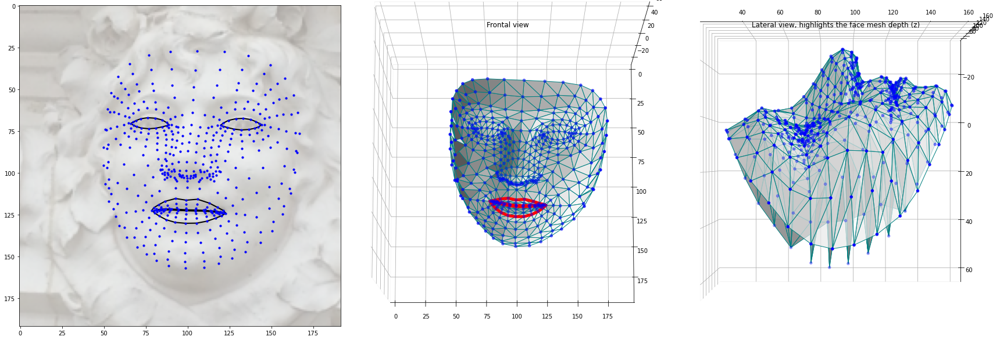

In [ ]:
visualize_3d_reconstruction(im1_arr_rescaled, face_landmarks_xyz)

### Summarize end-to-end pipeline and apply to various mascarons images

In [ ]:
def prediction_tflite_preparation(img_filename, preset_delta_crop = 500):
    """for the img_filename, read image, crop the central crop, resize it to (192,192) and
       normalize values in RGB channels to prepare it for inference  """

    #read image
    im1_tens, im1_arr = get_image(file_path = FOLDER_IMAGES + img_filename)
    #crop central square
    im1_tens_centralcrop = crop_central_square(im1_tens, preset_delta_ = preset_delta_crop)
    #rescale image
    im1_tens_rescaled = rescale_with_tf(im1_tens_centralcrop, target_size = (192,192))
    #in eager execution mode of TF we can convert tensor to numpy array
    im1_arr_rescaled = im1_tens_rescaled.numpy()
    #normalize pixels values in each RGB channel
    im1_arr_normalized = normalize_pixel_values(im1_arr_rescaled)
    return im1_arr_rescaled, im1_arr_normalized

In [ ]:
def prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized):
    """ execute inference with the TFLite model and visualize results """

    #the input must be batch
    batch_arr_preprocessed = np.array([im1_arr_normalized], dtype=np.float32)
    #pass batch to model's input
    facelandmarks_model.allocate_tensors()
    facelandmarks_model.set_tensor(input_details_fl[0]['index'], batch_arr_preprocessed)
    #inference
    facelandmarks_model.invoke()
    #collect result
    result_face_landmarks = facelandmarks_model.get_tensor(output_details_fl[0]['index'])
    #post-process result
    num_cols = 3
    num_rows = int(result_face_landmarks.shape[-1]/num_cols)
    face_landmarks_xyz = np.reshape(result_face_landmarks[0][0][0], (num_rows, num_cols))

    #visualize result
    visualize_3d_reconstruction(im1_arr_rescaled, face_landmarks_xyz)

**ILLUSTRATION 1**

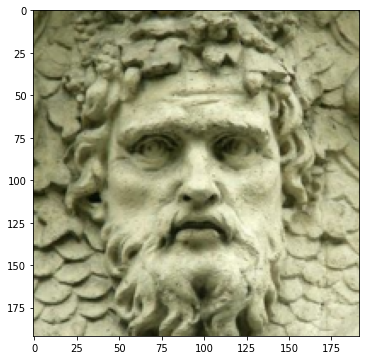

In [ ]:
#inspect what resulted so far
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron2.jpg",
                                                                     preset_delta_crop = 130)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

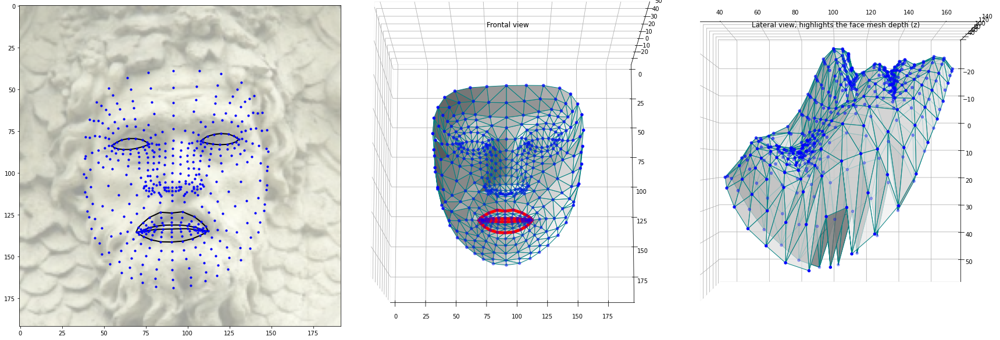

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 2**

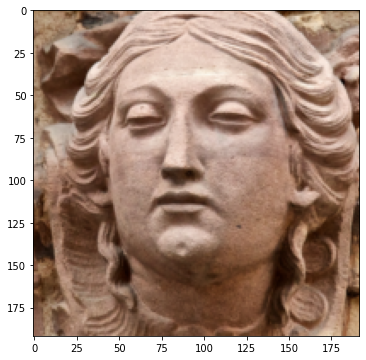

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron3.jpg",
                                                                     preset_delta_crop = 600)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

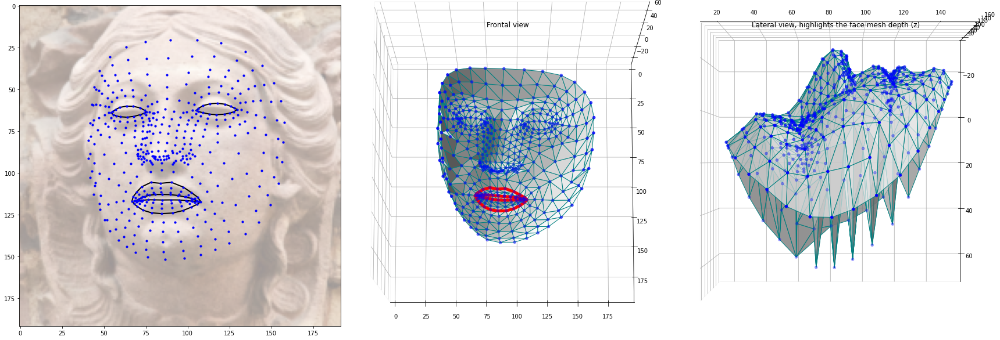

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 3**

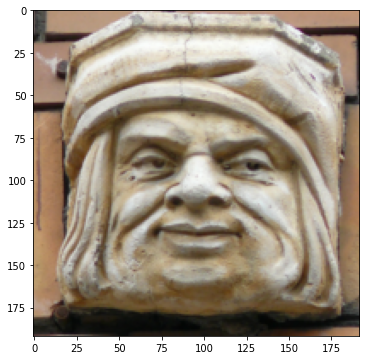

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron4.jpg",
                                                                     preset_delta_crop = None)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

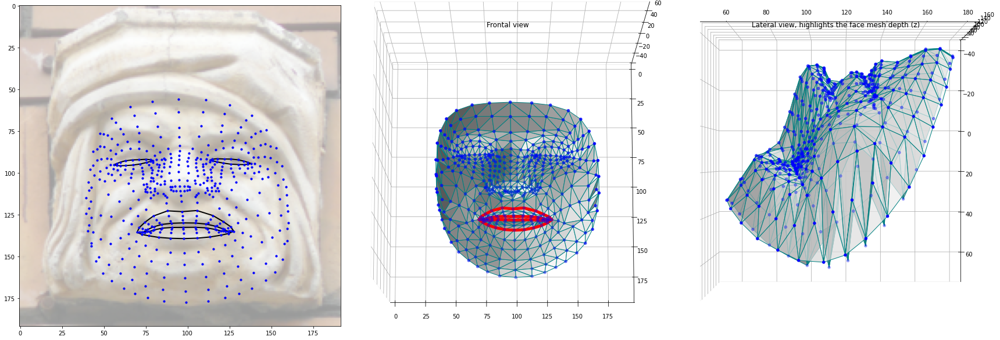

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 4**

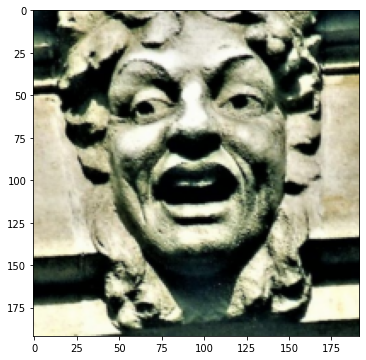

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron5.jpg",
                                                                     preset_delta_crop = 240)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

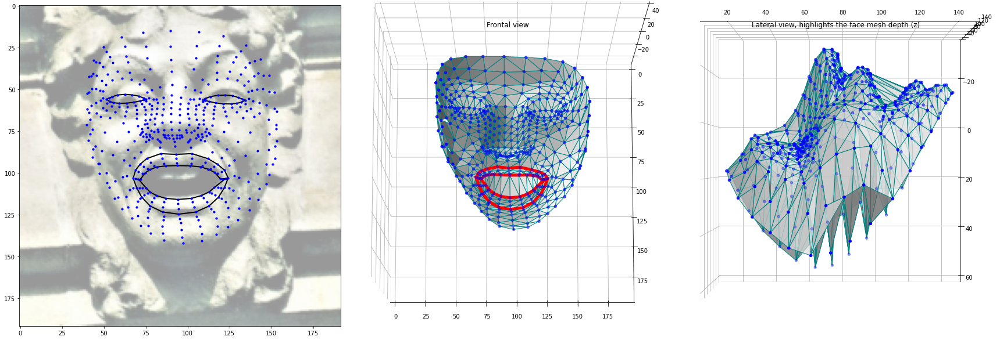

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 5**

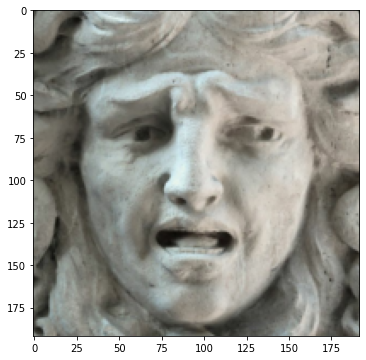

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron6.jpg",
                                                                     preset_delta_crop = 300)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

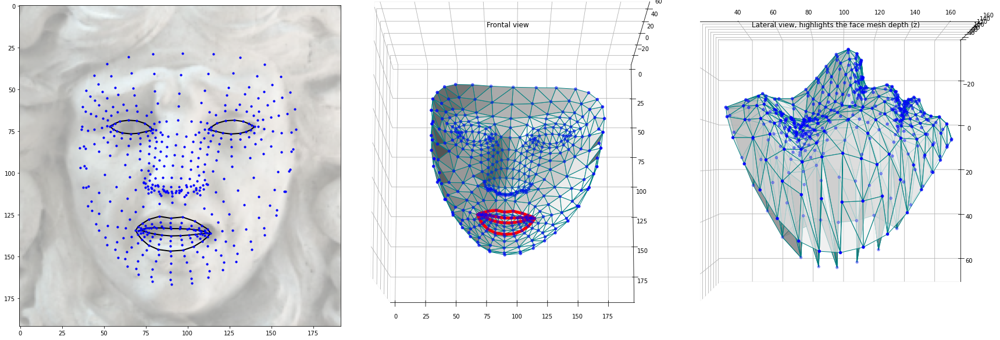

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 6**

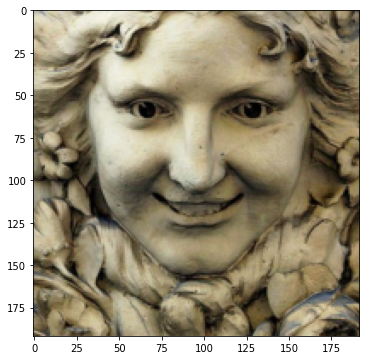

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron7.jpg",
                                                                     preset_delta_crop = 200)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

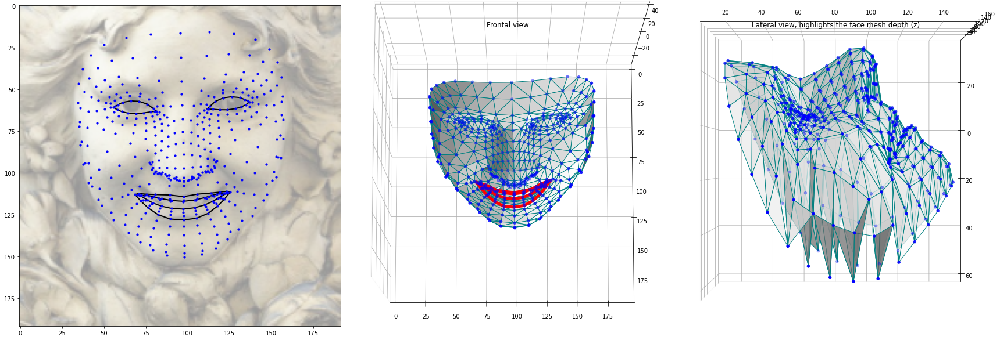

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**ILLUSTRATION 7**

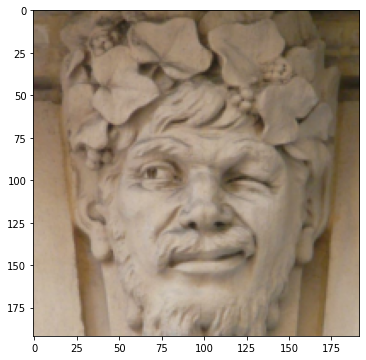

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron8.jpg",
                                                                     preset_delta_crop = 350)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

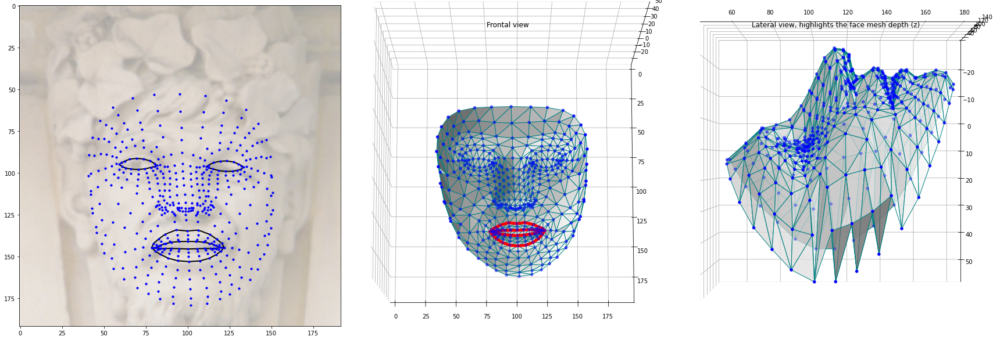

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

**We end with 2 more illustrations that show limitations of the pretrained TFLite model when the face is not positioned in the middle of the image and when the face is not oval:**

**ILLUSTRATION 8**

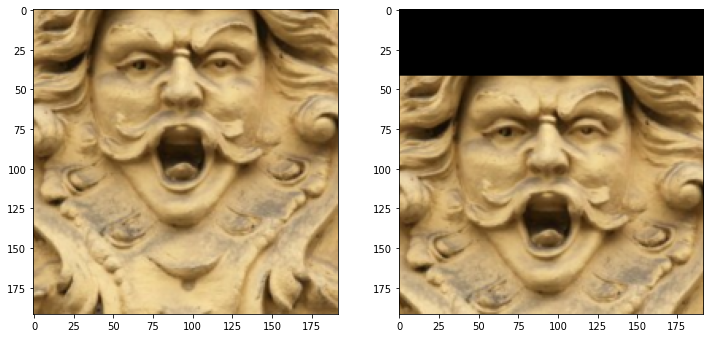

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron9.jpg",
                                                                     preset_delta_crop = 120)

im1_arr_rescaled_repositioned = np.zeros_like(im1_arr_rescaled)
im1_arr_normalized_repositioned = np.zeros_like(im1_arr_normalized)

#place the face in the middle now
im1_arr_rescaled_repositioned[42:,:,:] = im1_arr_rescaled[0:150,:,:]
im1_arr_normalized_repositioned[42:,:,:] = im1_arr_normalized[0:150,:,:]

fig,ax = plt.subplots(1,2, figsize = (12,6))
ax[0].imshow(im1_arr_rescaled)
ax[1].imshow(im1_arr_rescaled_repositioned)

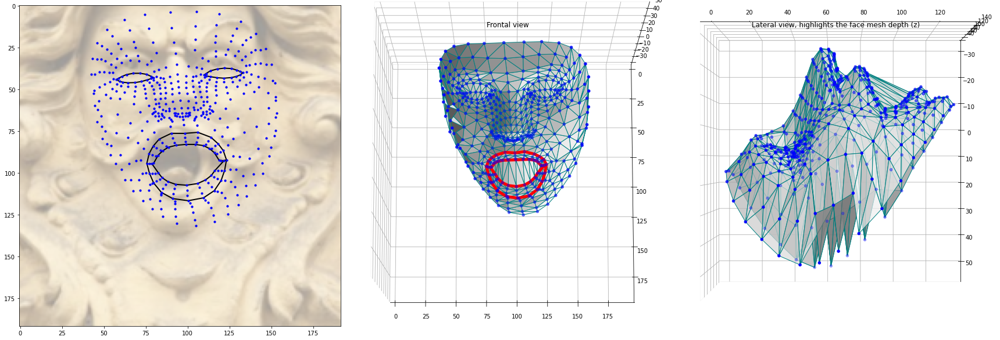

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

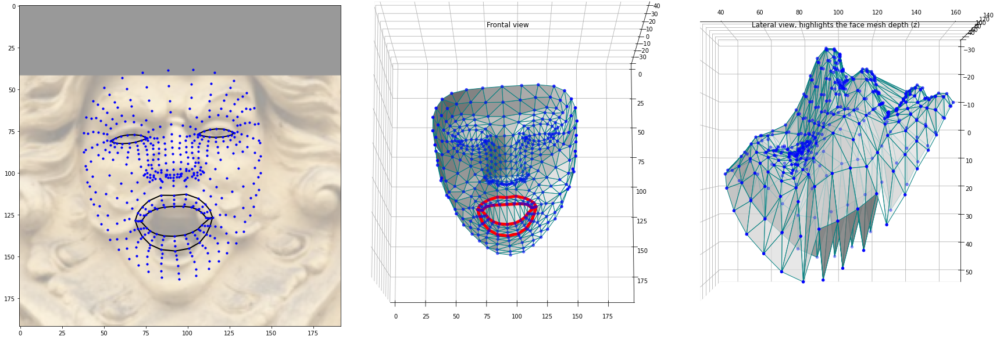

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled_repositioned, im1_arr_normalized_repositioned)

Note: it is aligned better on the eyes, yet it fails to open the mouth to the real position on the lower lip

In [ ]:
#sidenote: the mediapipe package would give the same imperfect result
mp_face_mesh = mp.solutions.face_mesh.FaceMesh(
                static_image_mode=True,
                max_num_faces=1,
                min_detection_confidence=0.1)

results = mp_face_mesh.process(im1_arr_rescaled)
results

mediapipe.python.solution_base.SolutionOutputs

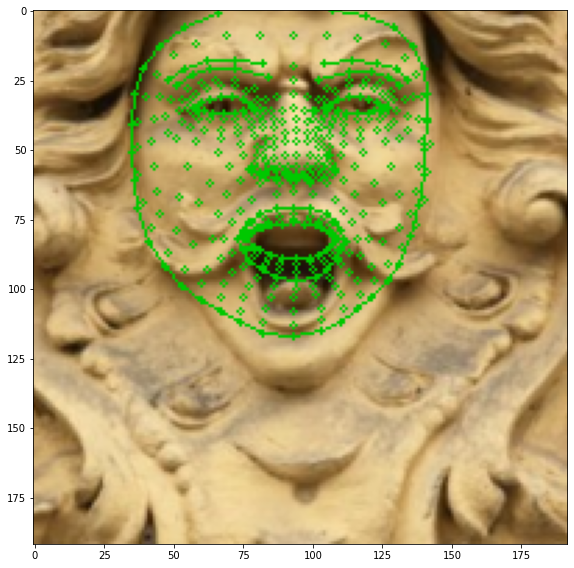

In [ ]:
drawing_spec = mp.solutions.drawing_utils.DrawingSpec(thickness=1, circle_radius=1, color=(0,200,0))

im1_arr_rescaled_cpy = im1_arr_rescaled.copy()

for face_landmarks in results.multi_face_landmarks:
    mp.solutions.drawing_utils.draw_landmarks(
        image = im1_arr_rescaled_cpy,
        landmark_list = face_landmarks,
        connections = mp.solutions.face_mesh.FACE_CONNECTIONS,
        landmark_drawing_spec = drawing_spec,
        connection_drawing_spec = drawing_spec)
    

fig,ax = plt.subplots(1,1, figsize = (8,8))
ax.imshow(im1_arr_rescaled_cpy)
fig.tight_layout()

**ILLUSTRATION 9**

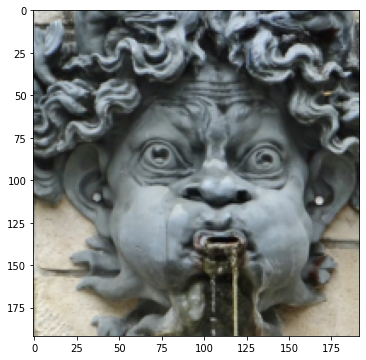

In [ ]:
im1_arr_rescaled, im1_arr_normalized = prediction_tflite_preparation(img_filename = "mascaron10.jpg",
                                                                     preset_delta_crop = 270)
fig,ax = plt.subplots(1,1, figsize = (6,6))
ax.imshow(im1_arr_rescaled)

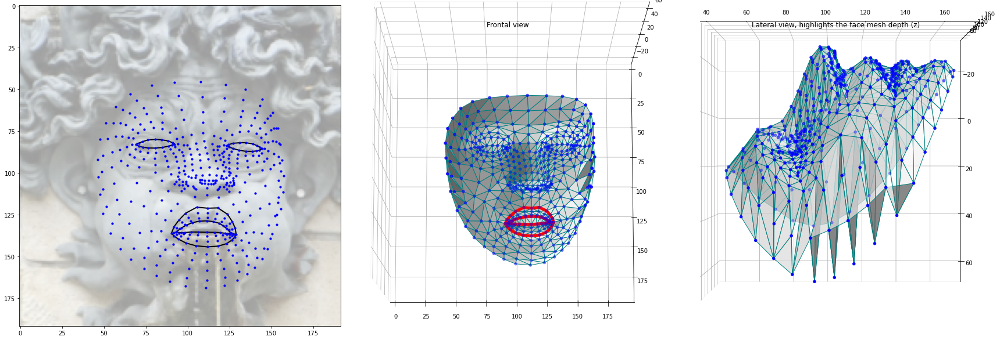

In [ ]:
prediction_tflite_inference_and_visualizaton(im1_arr_rescaled, im1_arr_normalized)

This time the alignment on facial landmarks has slightly improved, but it fails to predict the eyes big enough and to include the entire left cheeck of the mascaron of the fountain

In [ ]:
#sidenote: the mediapipe package would give the same imperfect result
mp_face_mesh = mp.solutions.face_mesh.FaceMesh(
                static_image_mode=True,
                max_num_faces=1,
                min_detection_confidence=0.1)

results = mp_face_mesh.process(im1_arr_rescaled)
results

mediapipe.python.solution_base.SolutionOutputs

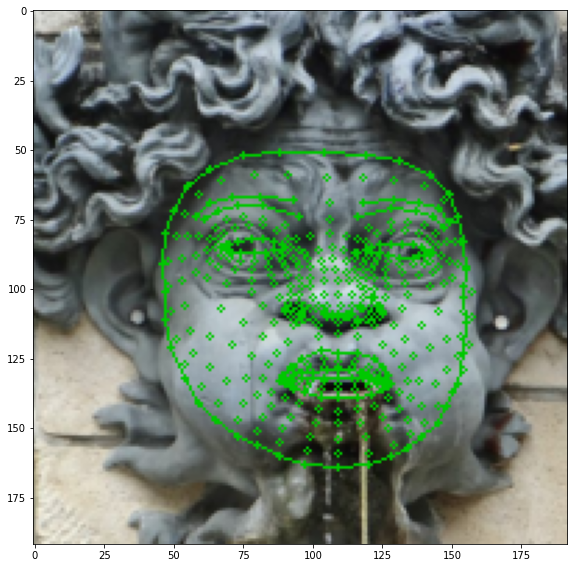

In [ ]:
drawing_spec = mp.solutions.drawing_utils.DrawingSpec(thickness=1, circle_radius=1, color=(0,200,0))

im1_arr_rescaled_cpy = im1_arr_rescaled.copy()

for face_landmarks in results.multi_face_landmarks:
    mp.solutions.drawing_utils.draw_landmarks(
        image = im1_arr_rescaled_cpy,
        landmark_list = face_landmarks,
        connections = mp.solutions.face_mesh.FACE_CONNECTIONS,
        landmark_drawing_spec = drawing_spec,
        connection_drawing_spec = drawing_spec)
    

fig,ax = plt.subplots(1,1, figsize = (8,8))
ax.imshow(im1_arr_rescaled_cpy)
fig.tight_layout()